#**Logistic Regression**

***Logistic regression is a statistical model, that in its basic form, uses a logistic function to model a binary dependent variable***, although many more complex extensions exist. 

Mathematically, a binary logistic model has a dependent variable with two possible values, such as pass/fail which is represented by an indicator variable, where the two values are labeled "0" and "1". In the logistic model, the log-odds (the logarithm of the odds) for the value labeled "1" is a linear combination of one or more independent variables (**"predictors"**); the independent variables can each be a binary variable (two classes, coded by an indicator variable) or a continuous variable (any real value). The corresponding probability of the value labeled "1" can vary between 0 (certainly the value "0") and 1 (certainly the value "1"), hence the labeling; 
**the function that converts log-odds to probability is the logistic function, hence the name. **

It’s a classification algorithm, that is used where the response variable is categorical. The idea of Logistic Regression is to find a relationship between features and probability of particular outcome.

***Why Logistic, not Linear?***

With binary classification, let ‘x’ be some feature and ‘y’ be the output which can be either 0 or 1.
The probability that the output is 1 given its input can be represented as:

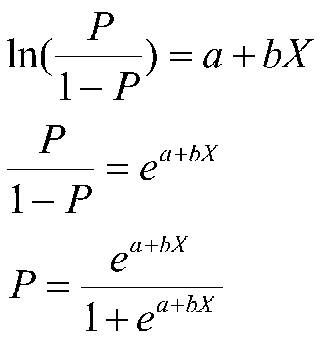

If we predict the probability via linear regression, we can state it as:

where, *p(x) = p(y=1|x)*

Linear regression model can generate the predicted probability as any number ranging from negative to positive infinity, whereas probability of an outcome can only lie between 0< P(x)<1.

***Further Reading:-***

https://ml-cheatsheet.readthedocs.io/en/latest/logistic_regression.html

https://towardsdatascience.com/logistic-regression-detailed-overview-46c4da4303bc

https://towardsdatascience.com/logistic-regression-cebee0728cbf

**Model**

Output = 0 or 1

Hypothesis => Z = WX + B

hΘ(x) = sigmoid (Z)

**Sigmoid Function**

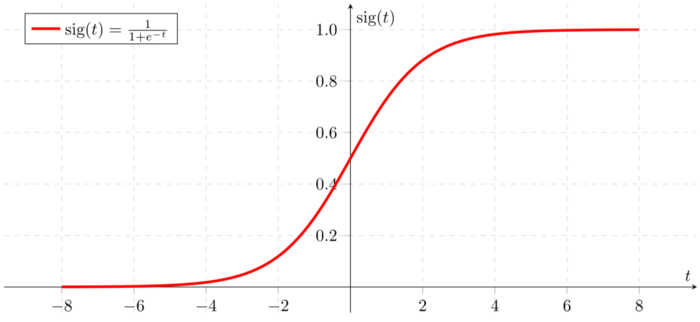

**Analysis of the hypothesis**


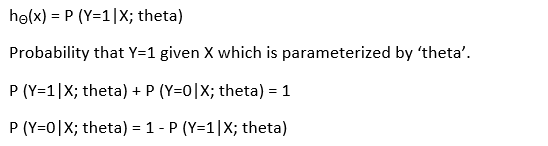

**Cost Function**


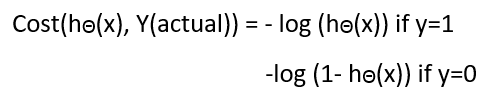

**Cost function explanation**


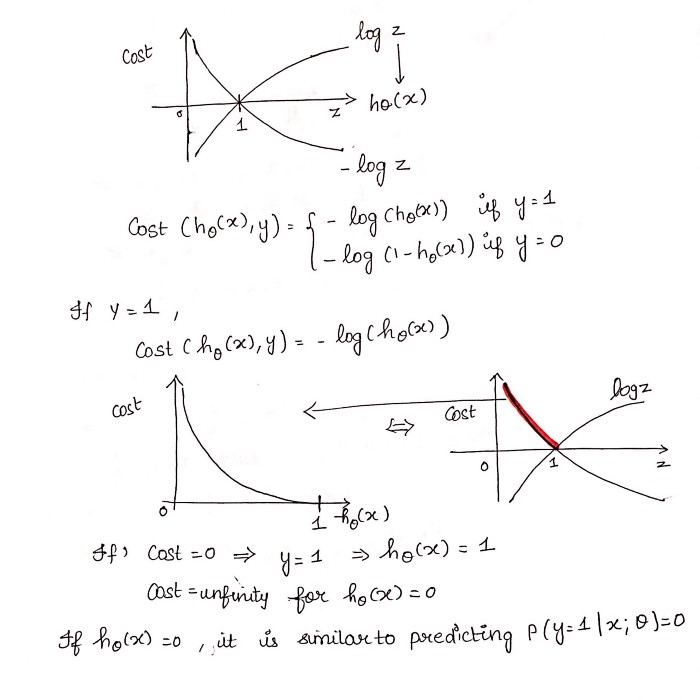

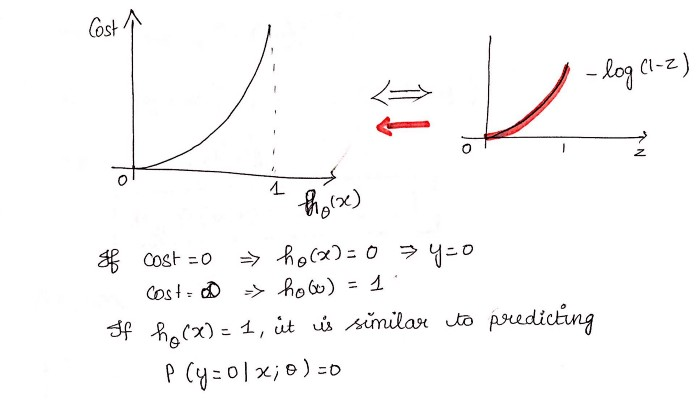

**Simplified cost function**


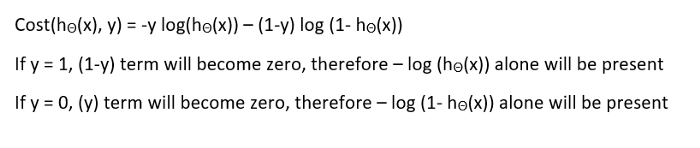

**Why this cost function?**

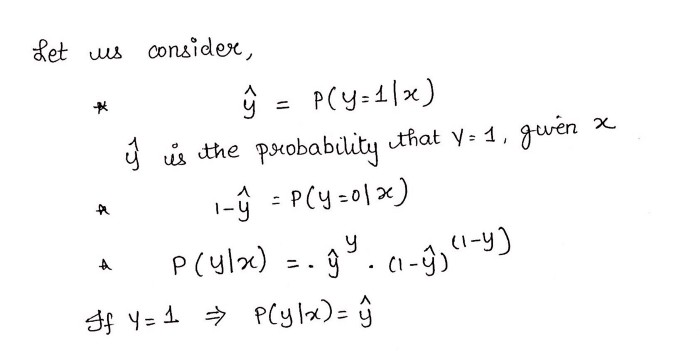

**Why this cost function?**

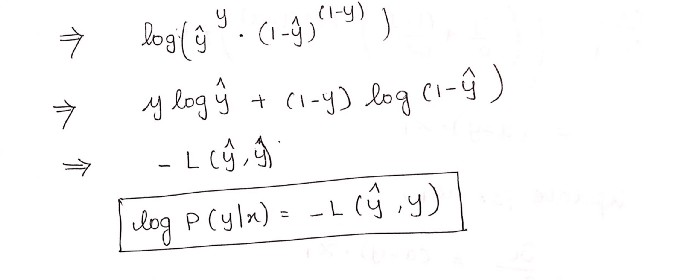

**Deriving the formula for Gradient Descent Algorithm**


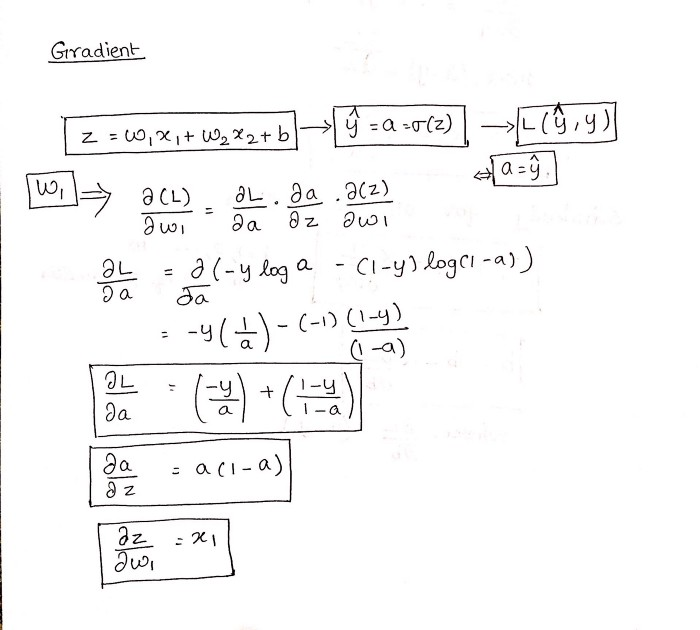

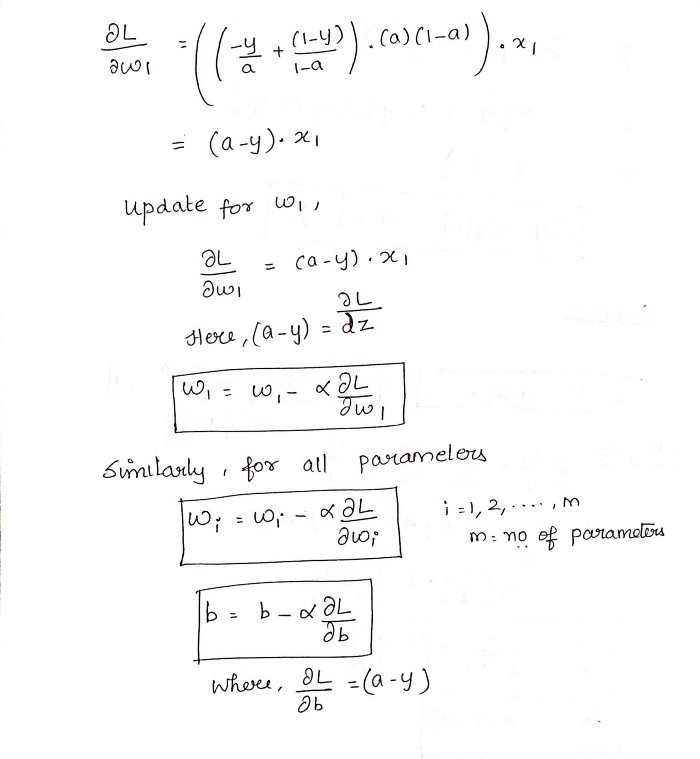

In statistics, the logistic model (or logit model) is used to model the probability of a certain class or event existing such as pass/fail, win/lose, alive/dead or healthy/sick. This can be extended to model several classes of events such as determining whether an image contains a cat, dog, lion, etc. Each object being detected in the image would be assigned a probability between 0 and 1, with a sum of one.

Logistic regression is a statistical model that in its basic form uses a logistic function to model a binary dependent variable, although many more complex extensions exist. In regression analysis, logistic regression[1] (or logit regression) is estimating the parameters of a logistic model (a form of binary regression). Mathematically, a binary logistic model has a dependent variable with two possible values, such as pass/fail which is represented by an indicator variable, where the two values are labeled "0" and "1".

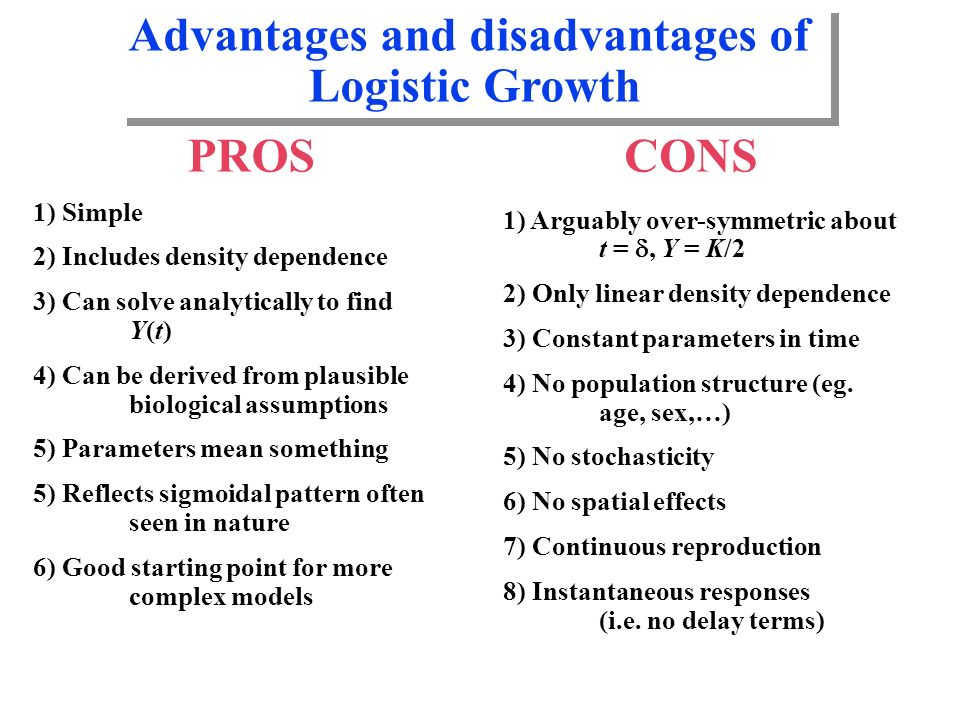

##**Using Numpy**

###**1-Binary**

The categorical response has only two 2 possible outcomes. Example: Spam or Not

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d volodymyrgavrysh/fraud-detection-bank-dataset-20k-records-binary

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/738k [00:00<?, ?B/s]
100% 738k/738k [00:00<00:00, 60.4MB/s]
Archive:  fraud-detection-bank-dataset-20k-records-binary.zip
replace fraud_detection_bank_dataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: fraud_detection_bank_dataset.csv  


In [ ]:
data=pd.read_csv('fraud_detection_bank_dataset.csv')
data

,Unnamed: 0,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,...,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,targets
0,0,9,1354,0,18,0,1,7,9,0,...,0,0,0,1,1,0,0,0,49,1
1,1,0,239,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,55,1
2,2,0,260,0,4,0,3,6,0,0,...,0,0,0,1,1,0,0,0,56,1
3,3,17,682,0,1,0,0,8,17,0,...,0,1,0,1,1,0,0,0,65,1
4,4,1,540,0,2,0,1,7,1,0,...,0,0,0,1,1,0,0,0,175,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20463,20463,0,88,0,0,0,2,-1,0,0,...,0,1,0,0,0,0,1,0,85,0
20464,20464,0,134,0,2,0,0,6,0,0,...,0,0,0,0,0,0,0,0,7,0
20465,20465,4,393,1,1,0,0,-1,4,0,...,0,1,0,0,0,0,0,0,45,0
20466,20466,0,10,0,1,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,5,0


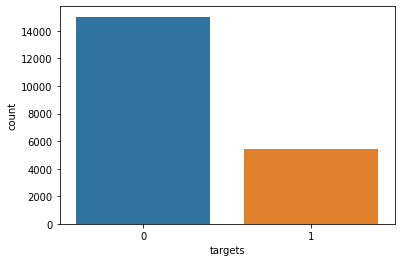

In [ ]:
# Countplot
sns.countplot(x=data.targets, data=data)

In [ ]:
# Train Test Split

x_train=np.array(data.iloc[0:19468,0:113]).reshape(19468,113)
x_test=np.array(data.iloc[19469:20468,0:113]).reshape(999,113)

y_train=np.array(data.iloc[0:19468,-1]).reshape(19468,1)
y_test=np.array(data.iloc[19469:20468,-1]).reshape(999,1)

# x_train.shape
y_train.shape

(19468, 1)

In [ ]:
X_train = np.hstack((np.ones((19468,1)), x_train))
X_test = np.hstack((np.ones((999,1)), x_test))
X_train.shape

(19468, 114)

In [ ]:
theta=np.zeros([114,1], dtype=int)

theta

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
    

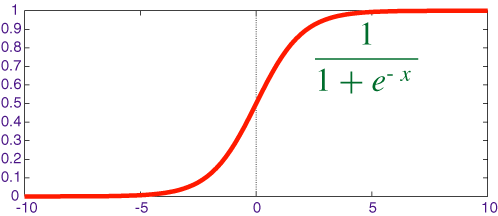

In [ ]:
# Defining the Sigmoid Function

def sigmoid(a):
  z= 1/(1+np.exp(-a))
  return z

sigmoid(1)

0.7310585786300049

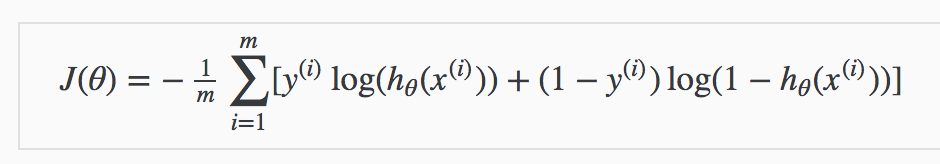

In [ ]:
# Defining Cost Function

def cost(x,y,theta):
  m=y_train.shape[0]
  y_pred=sigmoid(np.dot(X_train,theta))
  J = (-1/m) * np.sum(y_train*np.log(y_pred) + (1-y_train)*(1-np.log(1-y_pred)))
  return J

cost(X_train,y_train,theta)

-1.0265831403005472

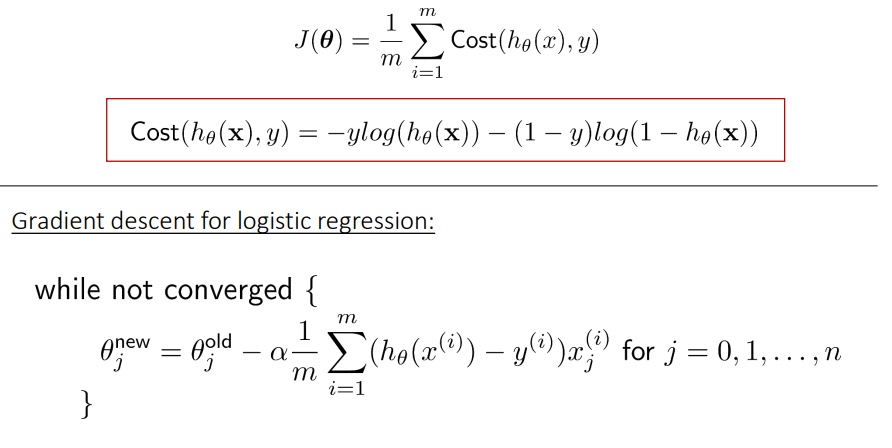

In [ ]:
# Gradient Descent for Logistic Regression

def gradient_descent(x,y,theta,lr,iter):
  for i in range(iter):
    m=y_train.shape[0]
    y_pred=sigmoid(np.dot(x,theta))
    theta=np.subtract(theta,((lr/m)*np.sum(np.dot(x.T,(y-y_pred)))))
    print(f'Iteration : {i} Cost : {cost(x,y,theta)}')
  return theta

gradient_descent(X_train,y_train,theta,lr=0.0001,iter=20)

Iteration : 0 Cost : nan
Iteration : 1 Cost : nan
Iteration : 2 Cost : nan
Iteration : 3 Cost : nan
Iteration : 4 Cost : nan
Iteration : 5 Cost : nan
Iteration : 6 Cost : nan
Iteration : 7 Cost : nan
Iteration : 8 Cost : nan
Iteration : 9 Cost : nan
Iteration : 10 Cost : nan
Iteration : 11 Cost : nan
Iteration : 12 Cost : nan
Iteration : 13 Cost : nan
Iteration : 14 Cost : nan
Iteration : 15 Cost : nan
Iteration : 16 Cost : nan
Iteration : 17 Cost : nan
Iteration : 18 Cost : nan
Iteration : 19 Cost : nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in multiply
  import sys


array([[83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83.19944784],
       [83

###**2-MultiClass**

Three or more categories without ordering. Example: Predicting which food is preferred more (Veg, Non-Veg, Vegan)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.25MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


In [ ]:
x=data.drop(['quality','Id'],axis=1)
plot=data.drop(['quality'],axis=1)
y=data[['quality']]
x.shape

(1143, 11)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


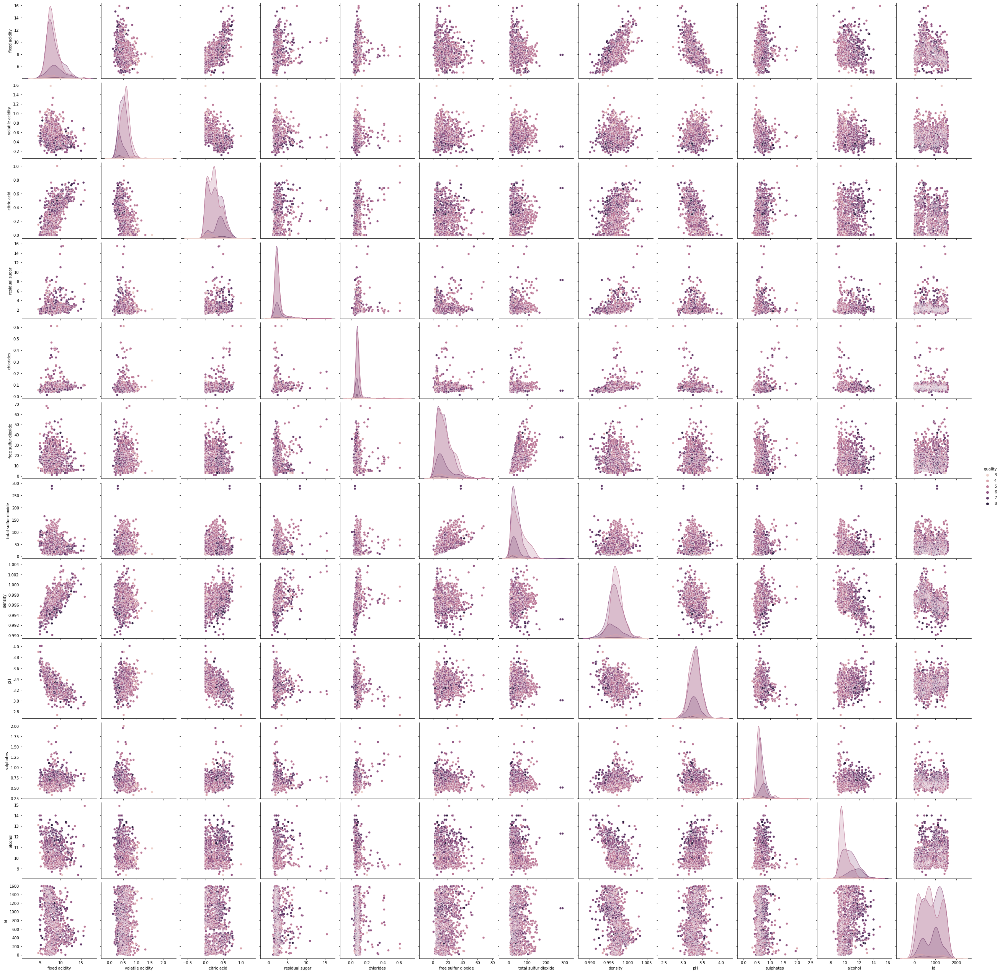

In [ ]:
# Plot PAIRPLOT
sns.pairplot(data,hue="quality",diag_kind="kde", size =3)


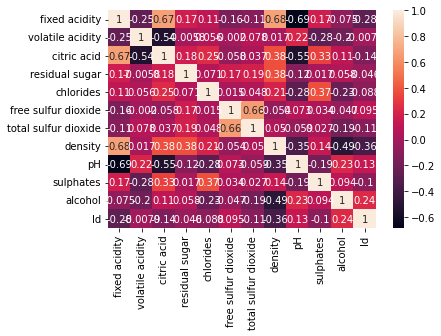

In [ ]:
# Plot HEATMAP
sns.heatmap(plot.corr(),annot=True)

In [ ]:
# Train Test Split

x_train=np.array(data.iloc[0:1000,0:11]).reshape(1000,11)
x_test=np.array(data.iloc[1001:1143,0:11]).reshape(142,11)

y_train=np.array(data.iloc[0:1000,-1]).reshape(1000,1)
y_test=np.array(data.iloc[1001:1143,-1]).reshape(142,1)

# x_train.shape
x_train.shape

(1000, 11)

In [ ]:
X_train = np.hstack((np.ones((1000,1)), x_train))
X_test = np.hstack((np.ones((142,1)), x_test))
X_train.shape

(1000, 12)

In [ ]:
theta=np.zeros([12,1], dtype=int)

theta

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]])

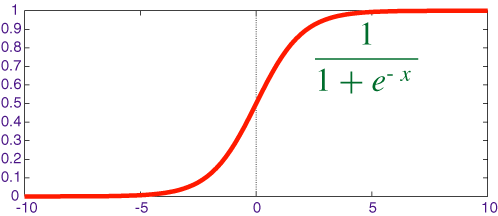

In [ ]:
# Defining the Sigmoid Function

def sigmoid(a):
  z= 1/(1+np.exp(-a))
  return z

sigmoid(1)

0.7310585786300049

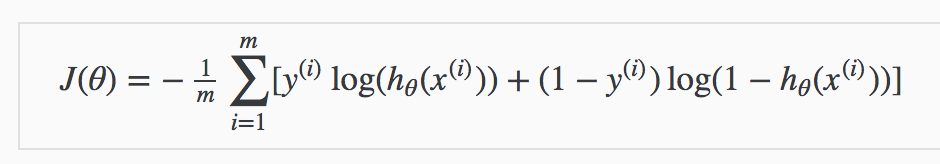

In [ ]:
# Defining Cost Function

def cost(x,y,theta):
  m=y_train.shape[0]
  y_pred=sigmoid(np.dot(X_train,theta))
  J = (-1/m) * np.sum(y_train*np.log(y_pred) + (1-y_train)*(1-np.log(1-y_pred)))
  return J

cost(X_train,y_train,theta)

1681.5129885564106

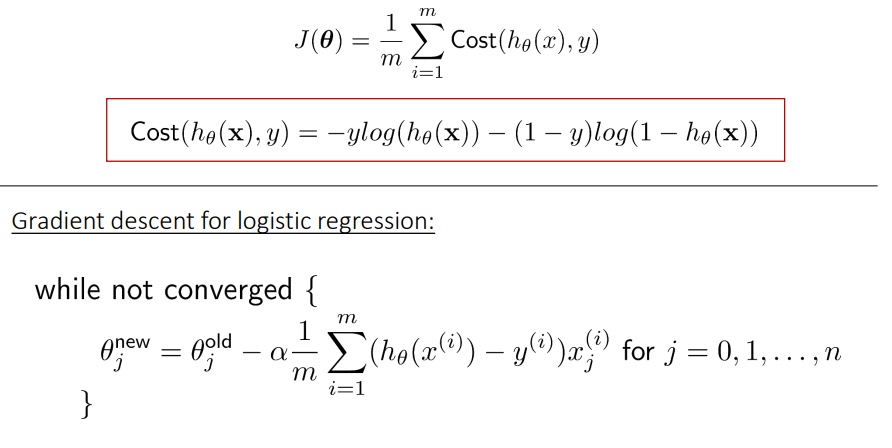

In [ ]:
# Gradient Descent for Logistic Regression

def gradient_descent(x,y,theta,lr,iter):
  for i in range(iter):
    m=y_train.shape[0]
    y_pred=sigmoid(np.dot(x,theta))
    theta=np.subtract(theta,((lr/m)*np.sum(np.dot(x.T,(y-y_pred)))))
    print(f'Iteration : {i} Cost : {cost(x,y,theta)}')
  return theta

gradient_descent(X_train,y_train,theta,lr=0.001,iter=20)

Iteration : 0 Cost : nan
Iteration : 1 Cost : nan
Iteration : 2 Cost : nan
Iteration : 3 Cost : nan
Iteration : 4 Cost : nan
Iteration : 5 Cost : nan
Iteration : 6 Cost : nan
Iteration : 7 Cost : nan
Iteration : 8 Cost : nan
Iteration : 9 Cost : nan
Iteration : 10 Cost : nan
Iteration : 11 Cost : nan
Iteration : 12 Cost : nan
Iteration : 13 Cost : nan
Iteration : 14 Cost : nan
Iteration : 15 Cost : nan
Iteration : 16 Cost : nan
Iteration : 17 Cost : nan
Iteration : 18 Cost : nan
Iteration : 19 Cost : nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  


array([[-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807],
       [-1245.42445807]])

###**3-Lasso**

L1 or Lasso regularization penalizes the LLF with the scaled sum of the absolute values of the weights: |𝑏₀|+|𝑏₁|+⋯+|𝑏ᵣ|.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.10MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


In [ ]:
x=data.drop(['quality','Id'],axis=1)
plot=data.drop(['quality'],axis=1)
y=data[['quality']]
x.shape

(1143, 11)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


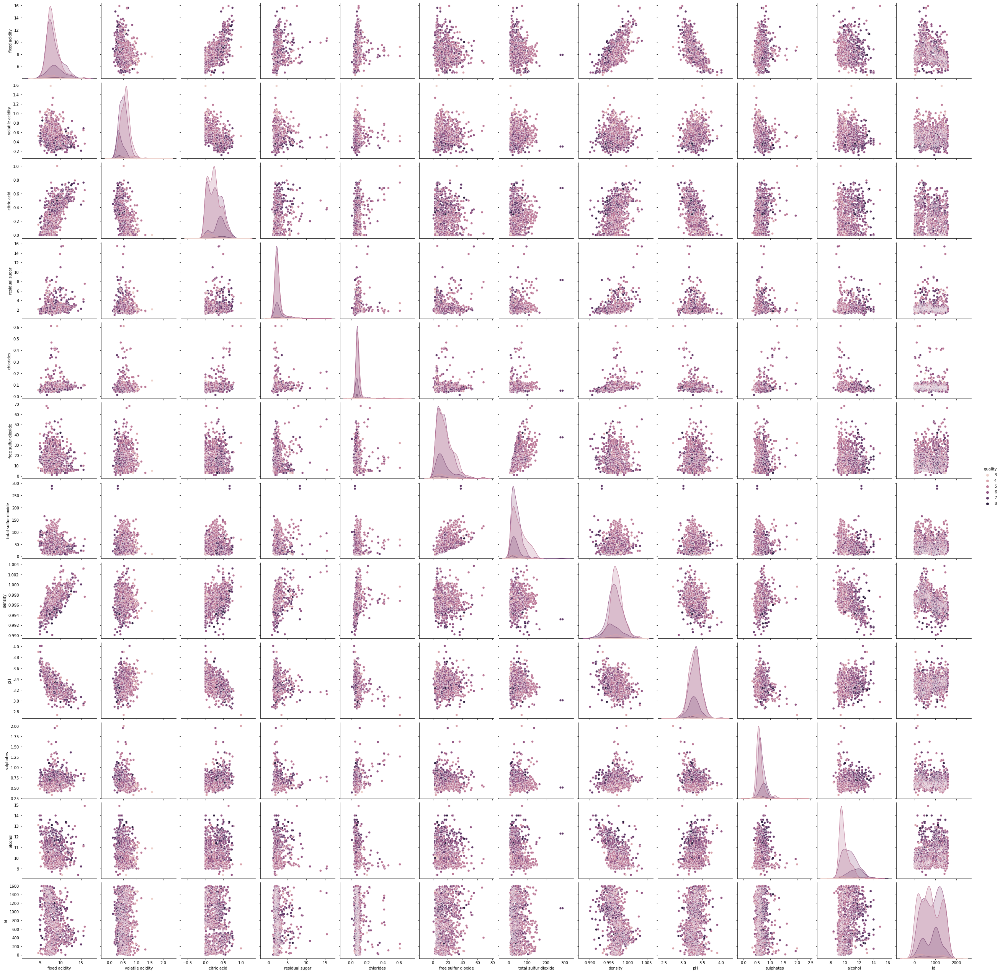

In [ ]:
# Plot PAIRPLOT
sns.pairplot(data,hue="quality",diag_kind="kde", size =3)

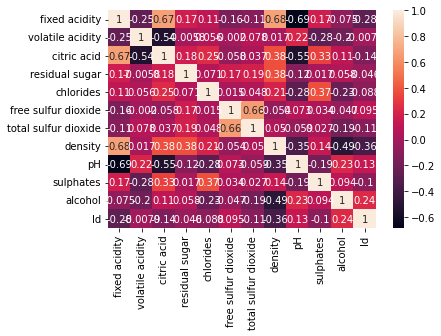

In [ ]:
# Plot HEATMAP
sns.heatmap(plot.corr(),annot=True)

In [ ]:
# Train Test Split

x_train=np.array(data.iloc[0:1000,0:11]).reshape(1000,11)
x_test=np.array(data.iloc[1001:1143,0:11]).reshape(142,11)

y_train=np.array(data.iloc[0:1000,-1]).reshape(1000,1)
y_test=np.array(data.iloc[1001:1143,-1]).reshape(142,1)

# x_train.shape
x_train.shape

(1000, 11)

In [ ]:
X_train = np.hstack((np.ones((1000,1)), x_train))
X_test = np.hstack((np.ones((142,1)), x_test))
X_train.shape

(1000, 12)

In [ ]:
theta=np.zeros([12,1], dtype=int)

theta

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]])

In [ ]:
# Defining the Sigmoid Function

def sigmoid(a):
  z= 1/(1+np.exp(-a))
  return z

sigmoid(1)

0.7310585786300049

In [ ]:
# Defining Cost Function

def cost(x,y,theta):
  m=y_train.shape[0]
  y_pred=sigmoid(np.dot(X_train,theta))
  J = (-1/m) * np.sum(y_train*np.log(y_pred) + (1-y_train)*(1-np.log(1-y_pred)))
  return J

cost(X_train,y_train,theta)

1681.5129885564106

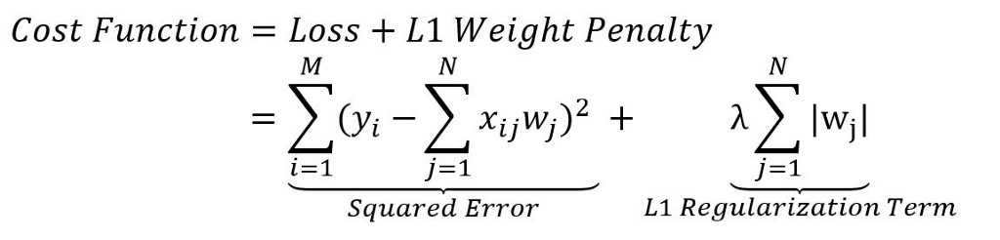

In [ ]:
# Gradient Descent with L1 Regularization for Logistic Regression

def gradient_descent(x,y,theta,lr,iter,alpha):
  for i in range(iter):
    m=y_train.shape[0]
    y_pred=sigmoid(np.dot(x,theta))
    for i in range(len(theta)):
      if theta[i]<0 :
        theta=np.subtract(theta,((lr/m)*np.sum(np.dot(x.T,(y-y_pred))))) + (alpha*np.sum(np.abs(theta)))
      else :
        theta=np.subtract(theta,((lr/m)*np.sum(np.dot(x.T,(y-y_pred))))) - (alpha*np.sum(np.abs(theta)))
    print(f'Iteration : {i} Cost : {cost(x,y,theta)}')
  return theta

gradient_descent(X_train,y_train,theta,lr=0.001,iter=20,alpha=0.5)

Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan
Iteration : 11 Cost : nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


array([[5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168],
       [5.87000968e+168]])

###**4-Ridge**

L2 or Ridge regularization penalizes the LLF with the scaled sum of the squares of the weights: 𝑏₀²+𝑏₁²+⋯+𝑏ᵣ²

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.16MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


In [ ]:
x=data.drop(['quality','Id'],axis=1)
plot=data.drop(['quality'],axis=1)
y=data[['quality']]
x.shape

(1143, 11)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


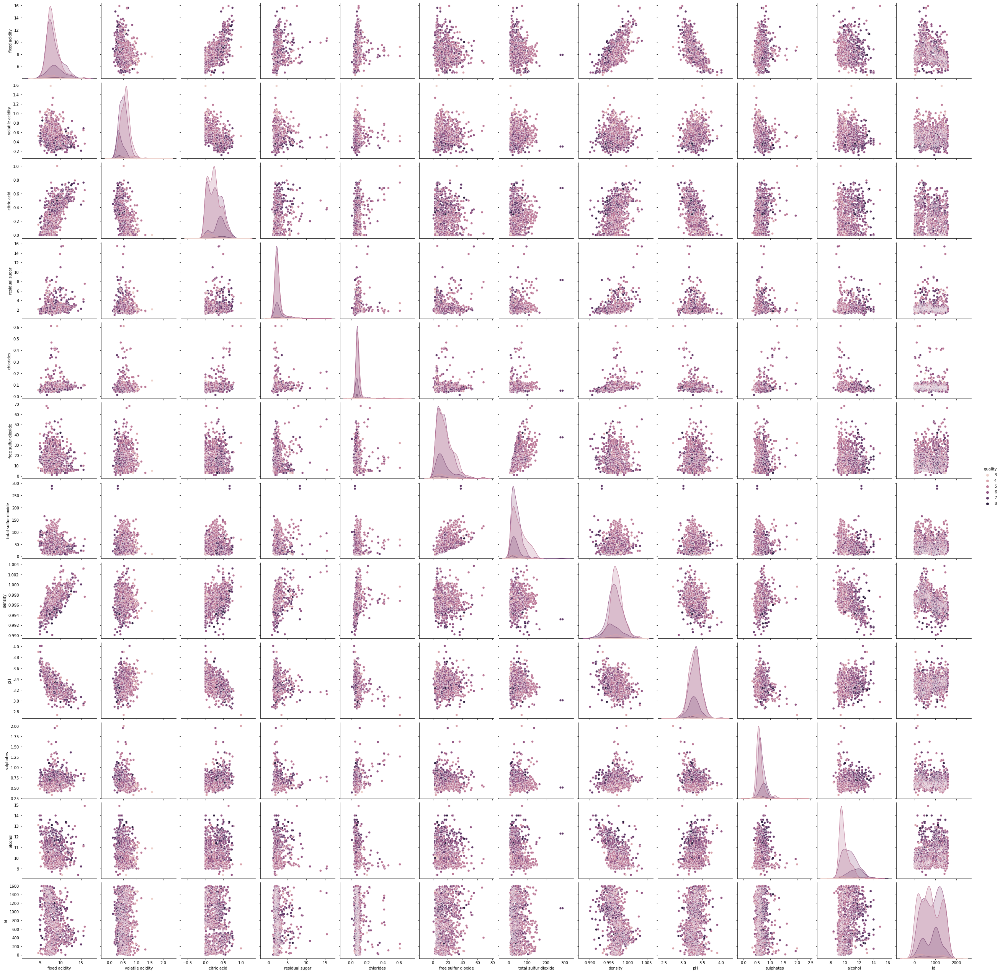

In [ ]:
# Plot PAIRPLOT
sns.pairplot(data,hue="quality",diag_kind="kde", size =3)

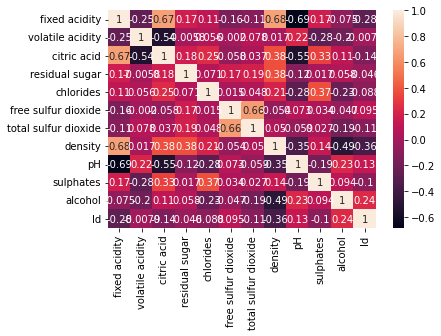

In [ ]:
# Plot HEATMAP
sns.heatmap(plot.corr(),annot=True)

In [ ]:
# Train Test Split

x_train=np.array(data.iloc[0:1000,0:11]).reshape(1000,11)
x_test=np.array(data.iloc[1001:1143,0:11]).reshape(142,11)

y_train=np.array(data.iloc[0:1000,-1]).reshape(1000,1)
y_test=np.array(data.iloc[1001:1143,-1]).reshape(142,1)

# x_train.shape
x_train.shape

(1000, 11)

In [ ]:
X_train = np.hstack((np.ones((1000,1)), x_train))
X_test = np.hstack((np.ones((142,1)), x_test))
X_train.shape

(1000, 12)

In [ ]:
theta=np.zeros([12,1], dtype=int)

theta

array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]])

In [ ]:
# Defining the Sigmoid Function

def sigmoid(a):
  z= 1/(1+np.exp(-a))
  return z

sigmoid(1)

0.7310585786300049

In [ ]:
# Defining Cost Function

def cost(x,y,theta):
  m=y_train.shape[0]
  y_pred=sigmoid(np.dot(X_train,theta))
  J = (-1/m) * np.sum(y_train*np.log(y_pred) + (1-y_train)*(1-np.log(1-y_pred)))
  return J

cost(X_train,y_train,theta)

1681.5129885564106

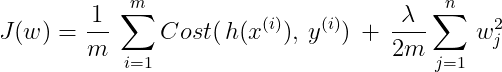

In [ ]:
# Gradient Descent with L2 Regularization for Logistic Regression

def gradient_descent(x,y,theta,lr,iter,alpha):
  for i in range(iter):
    m=y_train.shape[0]
    y_pred=sigmoid(np.dot(x,theta))
    theta=np.subtract(theta,((lr/m)*np.sum(np.dot(x.T,(y-y_pred))))) - (alpha/(2*m) * np.sum(np.square(theta)))
    print(f'Iteration : {i} Cost : {cost(x,y,theta)}')
  return theta

gradient_descent(X_train,y_train,theta,lr=0.001,iter=20,alpha=0.5)

Iteration : 0 Cost : nan
Iteration : 1 Cost : nan
Iteration : 2 Cost : nan
Iteration : 3 Cost : nan
Iteration : 4 Cost : nan
Iteration : 5 Cost : nan
Iteration : 6 Cost : nan
Iteration : 7 Cost : nan
Iteration : 8 Cost : nan
Iteration : 9 Cost : nan
Iteration : 10 Cost : nan
Iteration : 11 Cost : nan
Iteration : 12 Cost : nan
Iteration : 13 Cost : nan
Iteration : 14 Cost : nan
Iteration : 15 Cost : nan
Iteration : 16 Cost : nan
Iteration : 17 Cost : nan
Iteration : 18 Cost : nan
Iteration : 19 Cost : nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in multiply
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in square
  import sys


array([[nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan],
       [nan]])

###**5-ElasticNet**

Elastic-net regularization is a linear combination of L1 and L2 regularization.

##**Using ScikitLearn** 

###**1-Binary**

Binary or binomial classification: exactly two classes to choose between (usually 0 and 1, true and false, or positive and negative)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d volodymyrgavrysh/fraud-detection-bank-dataset-20k-records-binary

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/738k [00:00<?, ?B/s]
100% 738k/738k [00:00<00:00, 44.0MB/s]
Archive:  fraud-detection-bank-dataset-20k-records-binary.zip
replace fraud_detection_bank_dataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: fraud_detection_bank_dataset.csv  


In [ ]:
data=pd.read_csv('fraud_detection_bank_dataset.csv')
data

,Unnamed: 0,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,...,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,targets
0,0,9,1354,0,18,0,1,7,9,0,...,0,0,0,1,1,0,0,0,49,1
1,1,0,239,0,1,0,1,0,0,0,...,0,1,0,0,0,0,0,0,55,1
2,2,0,260,0,4,0,3,6,0,0,...,0,0,0,1,1,0,0,0,56,1
3,3,17,682,0,1,0,0,8,17,0,...,0,1,0,1,1,0,0,0,65,1
4,4,1,540,0,2,0,1,7,1,0,...,0,0,0,1,1,0,0,0,175,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20463,20463,0,88,0,0,0,2,-1,0,0,...,0,1,0,0,0,0,1,0,85,0
20464,20464,0,134,0,2,0,0,6,0,0,...,0,0,0,0,0,0,0,0,7,0
20465,20465,4,393,1,1,0,0,-1,4,0,...,0,1,0,0,0,0,0,0,45,0
20466,20466,0,10,0,1,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,5,0


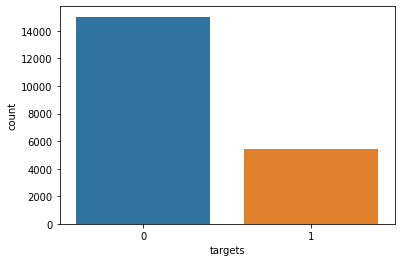

In [ ]:
# Countplot
sns.countplot(x='targets',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7fd2adc52490>,
 'caps': [<matplotlib.lines.Line2D at 0x7fd2adc5a910>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fd2adc6ebd0>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fd2adc6e510>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7fd2adc52ad0>,
  <matplotlib.lines.Line2D at 0x7fd2adb95f10>]}

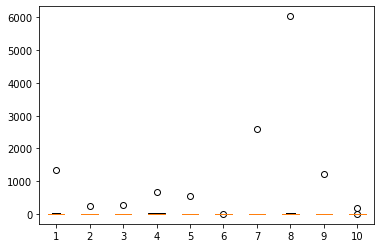

In [ ]:
# Boxplot
plt.boxplot(data.iloc[0:10,0:10], vert=True, patch_artist=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20468 entries, 0 to 20467
Columns: 114 entries, Unnamed: 0 to targets
dtypes: float64(1), int64(113)
memory usage: 17.8 MB


In [ ]:
data.describe()

,Unnamed: 0,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,...,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,targets
count,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.0,...,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000,20468.000000
mean,10233.500000,3.226256,294.793043,0.420021,2.329343,0.083594,0.939857,2.386066,3.226256,0.0,...,0.004935,0.358120,0.002443,0.308384,0.190737,0.000049,0.049345,0.024282,43.486125,0.265683
std,5908.746991,20.564308,717.541984,7.367275,10.068512,0.840537,4.222896,3.018140,20.564308,0.0,...,0.073478,0.479459,0.049366,0.461837,0.392892,0.006990,0.216593,0.305079,59.217560,0.441707
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5116.750000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000
50%,10233.500000,0.000000,97.000000,0.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.000000,0.000000
75%,15350.250000,2.000000,283.000000,0.000000,2.000000,0.000000,1.000000,6.000000,2.000000,0.0,...,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,61.250000,1.000000
max,20467.000000,2301.000000,37808.000000,904.000000,772.000000,54.000000,230.000000,11.000000,2301.000000,0.0,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,17.000000,747.000000,1.000000


In [ ]:
# Segeggrating X & Y
y=data[['targets']]
x=data.drop(['Unnamed: 0','targets'],axis=1)

x

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111
0,9,1354,0,18,0,1,7,9,0,0,...,4,0,0,0,1,1,0,0,0,49
1,0,239,0,1,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,55
2,0,260,0,4,0,3,6,0,0,0,...,1,0,0,0,1,1,0,0,0,56
3,17,682,0,1,0,0,8,17,0,0,...,1,0,1,0,1,1,0,0,0,65
4,1,540,0,2,0,1,7,1,0,0,...,1,0,0,0,1,1,0,0,0,175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20463,0,88,0,0,0,2,-1,0,0,0,...,0,0,1,0,0,0,0,1,0,85
20464,0,134,0,2,0,0,6,0,0,0,...,1,0,0,0,0,0,0,0,0,7
20465,4,393,1,1,0,0,-1,4,0,0,...,0,0,1,0,0,0,0,0,0,45
20466,0,10,0,1,0,0,-1,0,0,0,...,0,0,0,0,0,0,0,0,0,5


In [ ]:
# Train Test Split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(15351, 112)

In [ ]:
# Developing & Training the Logic Regression Model
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(random_state=42)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=42)

In [ ]:
y_pred=lr.predict(x_test)

In [ ]:
# Calculating the F1 Score
from sklearn.metrics import f1_score
s=f1_score(y_pred,y_test)
s

0.5722914307285769

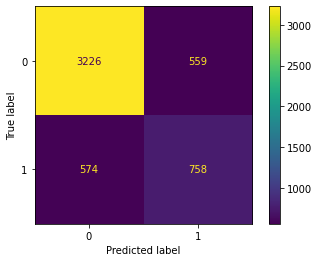

In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

###**2-Multiclass**

Multiclass or multinomial classification: three or more classes of the outputs to choose from


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 4.35MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


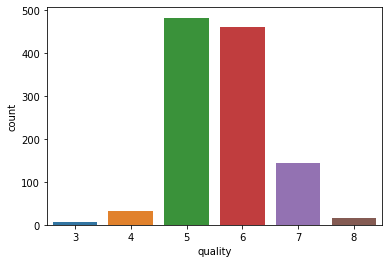

In [ ]:
sns.countplot(x='quality',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7f675ea8df10>,
 'caps': [<matplotlib.lines.Line2D at 0x7f675ea28490>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f675ea2f4d0>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f675ea28f10>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7f675ea8dd50>,
  <matplotlib.lines.Line2D at 0x7f675e8719d0>]}

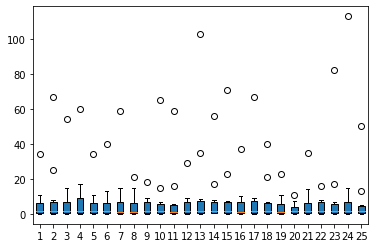

In [ ]:
plt.boxplot(data.iloc[0:25,0:10], vert=True, patch_artist=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [ ]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [ ]:
y=data[['quality']]
x=data.drop(['Id','quality'],axis=1)

x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(857, 11)

In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(random_state=42)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=42)

In [ ]:
y_pred=lr.predict(x_test)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=lr.classes_))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.62      0.73      0.67       118
           6       0.54      0.64      0.59       125
           7       0.00      0.00      0.00        30
           8       0.00      0.00      0.00         2

    accuracy                           0.58       286
   macro avg       0.19      0.23      0.21       286
weighted avg       0.49      0.58      0.53       286



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


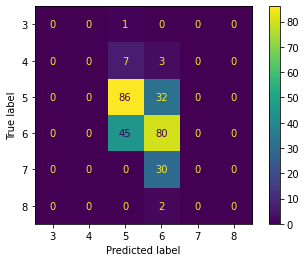

In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

###**3-Lasso**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.66MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


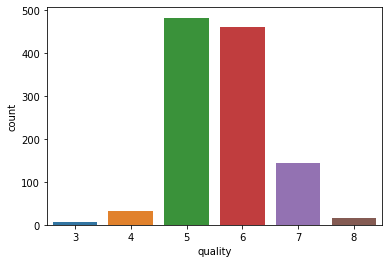

In [ ]:
sns.countplot(x='quality',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7f241a70b950>,
 'caps': [<matplotlib.lines.Line2D at 0x7f241a69bf10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f241a6a0f50>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f241a6a09d0>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7f241a70b750>,
  <matplotlib.lines.Line2D at 0x7f241a4eb210>]}

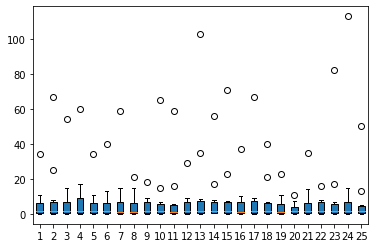

In [ ]:
plt.boxplot(data.iloc[0:25,0:10], vert=True, patch_artist=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [ ]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [ ]:
y=data[['quality']]
x=data.drop(['Id','quality'],axis=1)

x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(857, 11)

In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(penalty='l1',solver='liblinear',random_state=42)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression(penalty='l1', random_state=42, solver='liblinear')

In [ ]:
# Predicting
y_pred=lr.predict(x_test)

In [ ]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=lr.classes_))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        11
           5       0.68      0.75      0.71       131
           6       0.57      0.65      0.61       116
           7       0.60      0.25      0.35        24
           8       0.00      0.00      0.00         2

    accuracy                           0.63       286
   macro avg       0.31      0.27      0.28       286
weighted avg       0.59      0.63      0.60       286



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


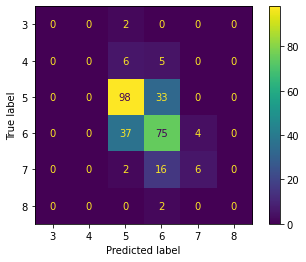

In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

###**4-Ridge**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 2.76MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


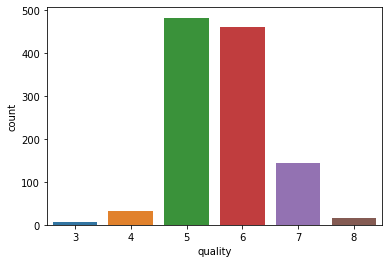

In [ ]:
# Countplot
sns.countplot(x='quality',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7f85790fbe90>,
 'caps': [<matplotlib.lines.Line2D at 0x7f8579115490>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f857911b4d0>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f8579115f10>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7f85790fbc50>,
  <matplotlib.lines.Line2D at 0x7f8578f609d0>]}

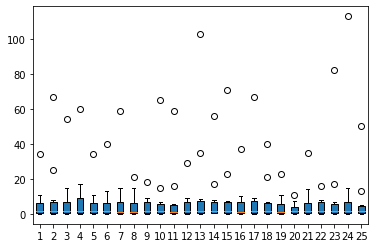

In [ ]:
# Boxplot
plt.boxplot(data.iloc[0:25,0:10], vert=True, patch_artist=True)

In [ ]:
# Info about the Data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [ ]:
# Data Description
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [ ]:
# Segreggating the Data in X & Y
y=data[['quality']]
x=data.drop(['Id','quality'],axis=1)

x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


In [ ]:
# Train Test Split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(857, 11)

In [ ]:
# Developing & Fitting the Model
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(penalty='l2',solver='lbfgs',random_state=42)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=42)

In [ ]:
# Predicting
y_pred=lr.predict(x_test)

In [ ]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=lr.classes_))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         7
           5       0.63      0.68      0.66       125
           6       0.45      0.63      0.53       108
           7       0.50      0.03      0.05        38
           8       0.00      0.00      0.00         5

    accuracy                           0.54       286
   macro avg       0.26      0.22      0.21       286
weighted avg       0.51      0.54      0.49       286



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


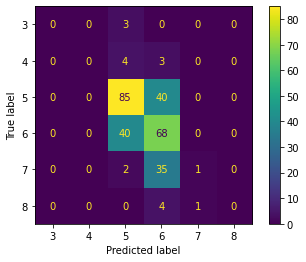

In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

###**5-Elasticnet**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [ ]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.01MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [ ]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


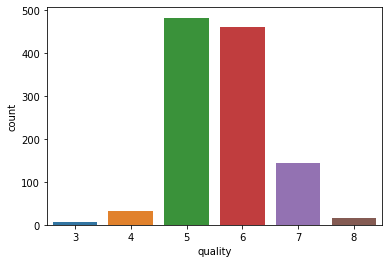

In [ ]:
# Countplot
sns.countplot(x='quality',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7ffb1fdfe7d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7ffb1fd8ad50>,
 'fliers': [<matplotlib.lines.Line2D at 0x7ffb1fd94d90>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7ffb1fd94810>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7ffb1fdfe5d0>,
  <matplotlib.lines.Line2D at 0x7ffb1fd3b510>]}

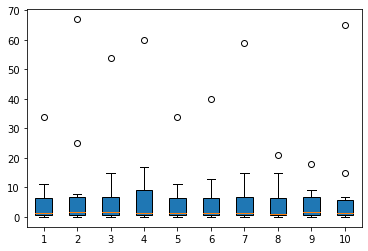

In [ ]:
# Boxplot
plt.boxplot(data.iloc[0:10,0:10], vert=True, patch_artist=True)

In [ ]:
# Info about the Data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [ ]:
# Data Description
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [ ]:
# Segreggating the Data in X & Y
y=data[['quality']]
x=data.drop(['Id','quality'],axis=1)

x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


In [ ]:
# Train Test Split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(857, 11)

In [ ]:
# Developing & Fitting the Model
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression(penalty='elasticnet',solver='saga',random_state=42,l1_ratio=0.5)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


LogisticRegression(l1_ratio=0.5, penalty='elasticnet', random_state=42,
                   solver='saga')

In [ ]:
# Predicting
y_pred=lr.predict(x_test)

In [ ]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=lr.classes_))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        10
           5       0.57      0.58      0.58       107
           6       0.48      0.69      0.57       124
           7       0.00      0.00      0.00        41
           8       0.00      0.00      0.00         4

   micro avg       0.52      0.52      0.52       286
   macro avg       0.18      0.21      0.19       286
weighted avg       0.42      0.52      0.46       286



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

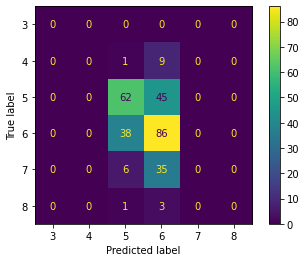

In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

###**6-LogisticRegressionCV**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle"
# /content/gdrive/My Drive/Kaggle is the path where kaggle.json is present in the Google Drive

#changing the working directory
%cd /content/gdrive/My Drive/Kaggle

Mounted at /content/gdrive
/content/gdrive/My Drive/Kaggle


In [2]:
!kaggle datasets download -d yasserh/wine-quality-dataset

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

  0% 0.00/21.5k [00:00<?, ?B/s]
100% 21.5k/21.5k [00:00<00:00, 3.59MB/s]
Archive:  wine-quality-dataset.zip
replace WineQT.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: WineQT.csv              


In [3]:
data=pd.read_csv('WineQT.csv')
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,2
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,3
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,1592
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,1593
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,1594
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,1595


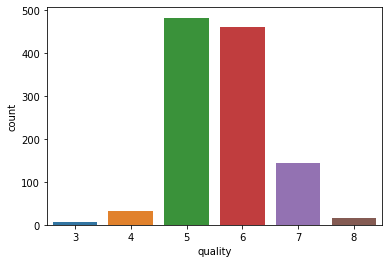

In [4]:
# Countplot
sns.countplot(x='quality',data=data,orient="h")

{'boxes': [<matplotlib.patches.PathPatch at 0x7f5d60a79990>,
 'caps': [<matplotlib.lines.Line2D at 0x7f5d60a87f10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f5d60a10f50>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f5d60a109d0>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7f5d60a87490>,
  <matplotlib.lines.Line2D at 0x7f5d609c0790>]}

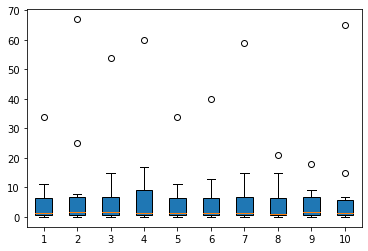

In [5]:
# Boxplot
plt.boxplot(data.iloc[0:10,0:10], vert=True, patch_artist=True)

In [6]:
# Info about the Data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [7]:
# Data Description
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043,804.969379
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824,463.997116
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000,411.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000,794.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000,1209.500000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1597.000000


In [8]:
# Segreggating the Data in X & Y
y=data[['quality']]
x=data.drop(['Id','quality'],axis=1)

x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1138,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1139,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1140,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1141,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2


In [9]:
# Train Test Split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)
x_train.shape

(857, 11)

In [10]:
# Developing & Fitting the Model
from sklearn.linear_model import LogisticRegressionCV
lr=LogisticRegressionCV(penalty='l2',cv=3,solver='lbfgs',random_state=42)
lr.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iteratio

LogisticRegressionCV(cv=3, random_state=42)

In [11]:
# Predicting
y_pred=lr.predict(x_test)

In [12]:
# Classification Report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=lr.classes_))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00        11
           5       0.63      0.74      0.68       113
           6       0.57      0.62      0.59       125
           7       0.47      0.24      0.31        34
           8       0.00      0.00      0.00         3

    accuracy                           0.59       286
   macro avg       0.28      0.27      0.26       286
weighted avg       0.55      0.59      0.57       286



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

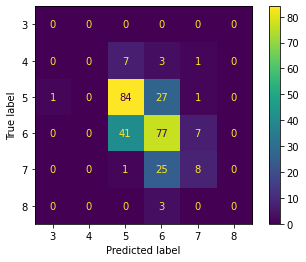

In [13]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lr.classes_)
disp.plot()

##**Evaluation**


####**Confusion Matrix (Binary)**

***precision(Sensitivity)*** = 
(TP) / (TP+FP)

***recall(Specificity,Positive-Prediction-Value)***
 = (TP) / (TP+FN)

####**Confusion-Matrix**
We want to predict some data using Classification in Machine Learning.

Let the classifier be SVM, Decision Tree, Random Forest, Logistic Rgression, and so on.

What are the observations? In each classifier, we get both right as well as wrong predictions.

Wrong predictions can again be categorized into:-
* False Positive
* False Negative

***False Positive (type I error)***

When we predict that something happens/occurs and it didn't happened/occured.(rejection of a true null hypothesis) Example :- We predict that an earthquake would occur which didn't happen.

***False Negative (type II error)***

When we predict that something won't happen/occur but it happens/occurs.(non-rejection of a false null hypothesis) Example :- We predict that there might be no earthquake but there occurs an earthquake.

Usually, type I errors are considered to be not as critical as type II errors.

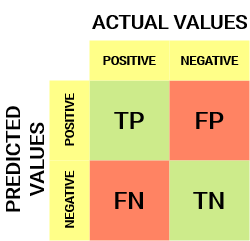

####**Confusion Matrix (Mutliclass)**

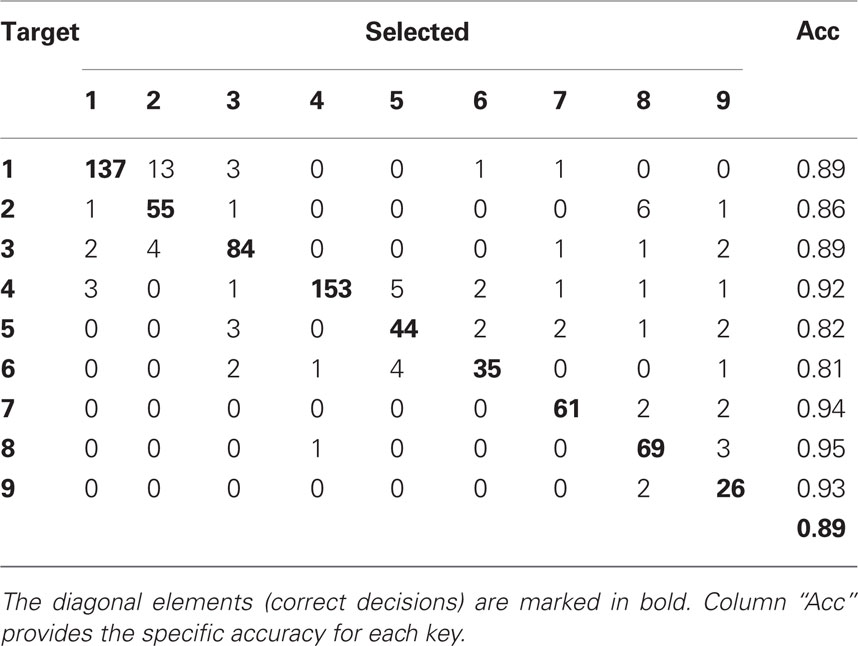

I would like to find the number of misclassified items. In the first row, there are 137 examples of class 1 that were classified as class 1, and 13 examples of class 1 that were classified as class 2. How to get this number?

####**F-1**

F1 Score

It is a harmonic mean between recall and precision. Its range is [0,1]. This metric usually tells us how precise (It correctly classifies how many instances) and robust (does not miss any significant number of instances) our classifier is.

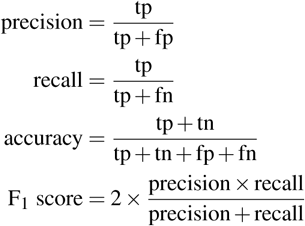

####**F-Beta**

F-BetaScore The Fbeta-measure is a generalization of the F-measure that adds a configuration parameter called beta. A default beta value is 1.0, which is the same as the F-measure. A smaller beta value, such as 0.5, gives more weight to precision and less to recall, whereas a larger beta value, such as 2.0, gives less weight to precision and more weight to recall in the calculation of the score.

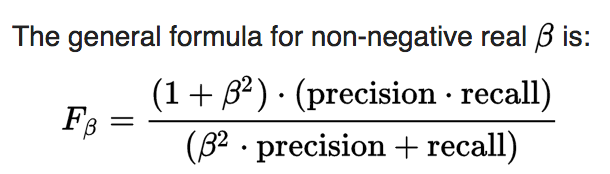

In [ ]:
from sklearn.metrics import fbeta_score
y_true = [0, 1, 2, 0, 1, 2]
y_pred = [0, 2, 1, 0, 0, 1]
fbeta_score(y_true, y_pred, average='macro', beta=0.5)

0.23809523809523805

####**Cohen Kappa**

Cohen's kappa coefficient is a statistic which measures inter-rater agreement for qualitative (categorical) items. It is generally thought to be a more robust measure than simple percent agreement calculation, since k takes into account the agreement occurring by chance. Cohen's kappa measures the agreement between two raters who each classify N items into C mutually exclusive categories.

Cohen's kappa coefficient is defined and given by the following function:

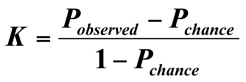

####**ROC & AUC Curve**

***ROC curve***

An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classification model at all classification thresholds. This curve plots two parameters:

* True Positive Rate
* False Positive Rate

True Positive Rate (TPR) is a synonym for recall and is therefore defined as follows:

False Positive Rate (FPR) is defined as follows:

An ROC curve plots TPR vs. FPR at different classification thresholds. Lowering the classification threshold classifies more items as positive, thus increasing both False Positives and True Positives. The following figure shows a typical ROC curve.

ROC Curve showing TP Rate vs. FP Rate at different classification thresholds.
Figure 4. TP vs. FP rate at different classification thresholds.

To compute the points in an ROC curve, we could evaluate a logistic regression model many times with different classification thresholds, but this would be inefficient. Fortunately, there's an efficient, sorting-based algorithm that can provide this information for us, called AUC.


***AUC: Area Under the ROC Curve***

AUC stands for "Area under the ROC Curve." That is, AUC measures the entire two-dimensional area underneath the entire ROC curve (think integral calculus) from (0,0) to (1,1).

AUC (Area under the ROC Curve).
Figure 5. AUC (Area under the ROC Curve).

AUC provides an aggregate measure of performance across all possible classification thresholds. One way of interpreting AUC is as the probability that the model ranks a random positive example more highly than a random negative example. For example, given the following examples, which are arranged from left to right in ascending order of logistic regression predictions:

Positive and negative examples ranked in ascending order of logistic regression score
Figure 6. Predictions ranked in ascending order of logistic regression score.

AUC represents the probability that a random positive (green) example is positioned to the right of a random negative (red) example.

AUC ranges in value from 0 to 1. A model whose predictions are 100% wrong has an AUC of 0.0; one whose predictions are 100% correct has an AUC of 1.0.

AUC is desirable for the following two reasons:

AUC is scale-invariant. It measures how well predictions are ranked, rather than their absolute values.
AUC is classification-threshold-invariant. It measures the quality of the model's predictions irrespective of what classification threshold is chosen.
However, both these reasons come with caveats, which may limit the usefulness of AUC in certain use cases:

Scale invariance is not always desirable. For example, sometimes we really do need well calibrated probability outputs, and AUC won’t tell us about that.

Classification-threshold invariance is not always desirable. In cases where there are wide disparities in the cost of false negatives vs. false positives, it may be critical to minimize one type of classification error. For example, when doing email spam detection, you likely want to prioritize minimizing false positives (even if that results in a significant increase of false negatives). AUC isn't a useful metric for this type of optimization.

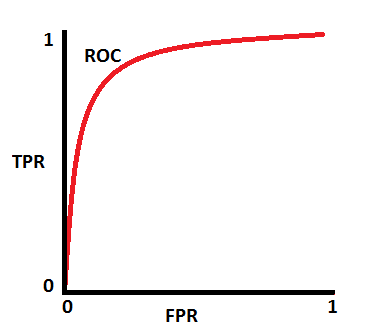

In [ ]:
# Binary
from sklearn.datasets import load_breast_cancer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
X, y = load_breast_cancer(return_X_y=True)
clf = LogisticRegression(solver="liblinear", random_state=0).fit(X, y)
roc_auc_score(y, clf.predict_proba(X)[:, 1])

0.994767718408118

In [ ]:
# Multiclass
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
X, y = load_iris(return_X_y=True)
clf = LogisticRegression(solver="liblinear").fit(X, y)
roc_auc_score(y, clf.predict_proba(X), multi_class='ovr')

0.9913333333333334